In [21]:
import torch
from torch import nn
from torch.nn import functional as F
from torch.utils.data import DataLoader
from torch.utils.data import random_split
import pytorch_lightning as pl
import os
import tensorflow as tf
import numpy as np
from tqdm import tqdm
from sklearn.model_selection import KFold
from sklearn.utils import shuffle
import pandas as pd
from sklearn.model_selection import train_test_split
from torchmetrics.functional import accuracy
from sklearn import metrics
import torch
import csv
from sklearn import metrics
from matplotlib import pyplot as plt
import math
import copy

torch.cuda.empty_cache()
torch.cuda.memory_summary(device=None, abbreviated=False)


tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
import sys
sys.path.append('../pre_processing_and_recover_network/')
import data_preprocessing
import importlib
importlib.reload(data_preprocessing)


<module 'data_preprocessing' from '/home1/eitan.c@staff.technion.ac.il/ECG_proj/dockvenv/code/simultaion/Emotion_Recognition_from_ECG_Eitan_Cohen-main/pytorch_model/../pre_processing_and_recover_network/data_preprocessing.py'>

**ECG**

In [22]:
class EmotionRec(pl.LightningModule):
  def __init__(self):
    super().__init__()
    dirname = "./"
    self.files=["test_stress.csv","test_arousal.csv","test_valence.csv",
    "train_stress.csv","train_arousal.csv","train_valence.csv"]
    self.output = os.path.join(os.path.dirname(dirname), 'light_output')
    self.cnn = nn.Sequential(
                            ## conv block 1
                              nn.Conv1d(in_channels = 1, out_channels = 32, kernel_size = 32, padding= 'same'),
                              nn.ReLU(),
                              nn.Conv1d(in_channels = 32, out_channels = 32, kernel_size = 32, padding= 'same'),
                              nn.ReLU(),
                              nn.MaxPool1d(kernel_size = 8, stride = 2 ),
                            ## conv block 2
                              nn.Conv1d(in_channels = 32, out_channels = 64, kernel_size = 16, padding= 'same'),
                              nn.ReLU(),
                              nn.Conv1d(in_channels = 64, out_channels = 64, kernel_size = 16, padding= 'same'),
                              nn.ReLU(),
                              nn.MaxPool1d(kernel_size = 8, stride = 2),
                            ## conv block 3
                              nn.Conv1d(in_channels = 64, out_channels = 128, kernel_size = 8, padding= 'same'),
                              nn.ReLU(),
                              nn.Conv1d(in_channels = 128, out_channels = 128, kernel_size = 8, padding= 'same'),
                              nn.ReLU(),
                              nn.MaxPool1d(kernel_size =  635 ,stride = 1))

    self.stress = nn.Sequential(nn.Flatten(),
                                nn.Linear(128, 512),
                                nn.ReLU(),
                                nn.Linear(512, 512), 
                                nn.ReLU(),
                                nn.Linear(512, 3)
                                )

    self.arousal = nn.Sequential(nn.Flatten(),
                                nn.Linear(128, 512),
                                nn.ReLU(),
                                nn.Linear(512, 512),
                                nn.ReLU(),
                                nn.Linear(512,9)
                                )
                  
    self.valence = nn.Sequential(nn.Flatten(),
                                nn.Linear(128, 512),
                                nn.ReLU(),
                                nn.Linear(512, 512),
                                nn.ReLU(),
                                nn.Linear(512,9)
                                )
              


  
  def forward(self, tensor_dataset):
    x = tensor_dataset[0]
    pp = tensor_dataset[1][:,0]
    y_stress = tensor_dataset[1][:,1]
    y_arousal = tensor_dataset[1][:,2]
    y_valence = tensor_dataset[1][:,3]
    z = self.cnn(x)
    y_hat_stress = self.stress(z)
    y_hat_arousal = self.arousal(z)
    y_hat_valence = self.valence(z)
    y_hat_stress = np.argmax(y_hat_stress.cpu().detach().numpy(), axis = 1)
    y_hat_arousal = np.argmax(y_hat_arousal.cpu().detach().numpy(), axis = 1)
    y_hat_valence = np.argmax(y_hat_valence.cpu().detach().numpy(), axis = 1)
    return y_hat_stress,y_hat_arousal,y_hat_valence

  def configure_optimizers(self):
    optimizer = torch.optim.Adam(self.parameters(), lr = 1e-3)
    return optimizer

  def training_step(self, tensor_dataset):
    x = tensor_dataset[0]
    pp = tensor_dataset[1][:,0]
    y_stress = tensor_dataset[1][:,1]
    y_arousal = tensor_dataset[1][:,2]
    y_valence = tensor_dataset[1][:,3]
    z = self.cnn(x)

    y_hat_stress = self.stress(z)
    y_hat_arousal = self.arousal(z)
    y_hat_valence = self.valence(z) 
    
    #log loss
    loss_stress = F.cross_entropy(y_hat_stress, y_stress)
    self.log('train_loss_stress', loss_stress)
    loss_arousal = F.cross_entropy(y_hat_arousal, y_arousal)
    self.log('train_loss_arousal',loss_arousal)
    loss_valence = F.cross_entropy(y_hat_valence, y_valence)
    self.log('train_loss_valence', loss_valence)

    #log acc
    y_hat_stress = np.argmax(y_hat_stress.cpu().detach().numpy(), axis = 1)
    acc_stress = metrics.accuracy_score(y_stress.cpu() , y_hat_stress)
    acc_stress = np.round(acc_stress, 4)
    stage = "train_stress"
    self.log(f"{stage}_acc", acc_stress, prog_bar=True)
    self.store_results("train_stress.csv",acc_stress,loss_stress)


    y_hat_arousal = np.argmax(y_hat_arousal.cpu().detach().numpy(), axis = 1)
    acc_arousal = metrics.accuracy_score(y_arousal.cpu() , y_hat_arousal)
    acc_arousal = np.round(acc_arousal, 4)
    stage = "train_arousal"
    self.log(f"{stage}_acc", acc_arousal, prog_bar=True)
    self.store_results("train_arousal.csv",acc_arousal,loss_arousal)

    y_hat_valence = np.argmax(y_hat_valence.cpu().detach().numpy(), axis = 1)
    acc_valence = metrics.accuracy_score(y_valence.cpu() , y_hat_valence)
    acc_valence = np.round(acc_valence, 4)
    stage = "train_valence"
    self.log(f"{stage}_acc", acc_valence, prog_bar=True)
    self.store_results("train_valence.csv",acc_valence,loss_valence)

    loss = loss_stress + loss_arousal + loss_valence
    return loss
    
  def validation_step(self, val_batch, batch_idx):
    self.evaluate(val_batch, "test")
    

  def evaluate(self, batch, stage=None):
    x = batch[0]
    pp = batch[1][:,0]
    y_stress = batch[1][:,1]
    y_arousal = batch[1][:,2]
    y_valence = batch[1][:,3]

    z = self.cnn(x)  

    y_hat_stress = self.stress(z)
    y_hat_arousal = self.arousal(z)
    y_hat_valence = self.valence(z) 

    loss_stress = F.cross_entropy(y_hat_stress, y_stress)
    loss_arousal = F.cross_entropy(y_hat_arousal, y_arousal)
    loss_valence = F.cross_entropy(y_hat_valence, y_valence)


    y_hat_stress = np.argmax(y_hat_stress.cpu().detach().numpy(), axis = 1)
    acc_stress = metrics.accuracy_score(y_stress.cpu() , y_hat_stress)
    acc_stress = np.round(acc_stress, 4)
    

    
 
    y_hat_arousal = np.argmax(y_hat_arousal.cpu().detach().numpy(), axis = 1)
    acc_arousal = metrics.accuracy_score(y_arousal.cpu() , y_hat_arousal)
    acc_arousal = np.round(acc_arousal, 4)

    y_hat_valence = np.argmax(y_hat_valence.cpu().detach().numpy(), axis = 1)
    acc_valence = metrics.accuracy_score(y_valence.cpu() , y_hat_valence)
    acc_valence = np.round(acc_valence, 4)

    if stage:
      #stress
      self.log(f"{stage}_loss_stress", loss_stress, prog_bar=True)
      self.log(f"{stage}_acc_stress", acc_stress, prog_bar=True)
      self.store_results("test_stress.csv",acc_stress,loss_stress)

      #arousal
      self.log(f"{stage}_loss_arousal", loss_arousal, prog_bar=True)
      self.log(f"{stage}_acc_arousal", acc_arousal, prog_bar=True)
      self.store_results("test_arousal.csv",acc_arousal,loss_arousal)

      #valence
      self.log(f"{stage}_loss_valence", loss_valence, prog_bar=True)
      self.log(f"{stage}_acc_valence", acc_valence, prog_bar=True)
      self.store_results("test_valence.csv",acc_valence,loss_valence)

      # follow after problemaic samples:

    wrong_label_stress=[]
    for i in range(len(y_hat_stress)):
      if(int(y_hat_stress[i])!=int(y_stress[i])):
        wrong_label_stress.append(int(pp[i]))
    file = os.path.join(self.output, "wrong_pp_stress.csv")
    with open(file, 'a', newline='') as csvfile:
        fieldnames = ['pp']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writerow({'pp': wrong_label_stress})

    wrong_label_arousal=[]
    for i in range(len(y_hat_arousal)):
      if(int(y_hat_arousal[i])!=int(y_arousal[i])):
        wrong_label_arousal.append(int(pp[i]))   
    file = os.path.join(self.output, "wrong_pp_arousal.csv")
    with open(file, 'a', newline='') as csvfile:
        fieldnames = ['pp']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writerow({'pp': wrong_label_arousal})
    
    wrong_label_valence=[]
    for i in range(len(y_hat_valence)):
      if(int(y_hat_valence[i])!=int(y_valence[i])):
        wrong_label_valence.append(int(pp[i]))   
    file = os.path.join(self.output, "wrong_pp_valence.csv")
    with open(file, 'a', newline='') as csvfile:
        fieldnames = ['pp']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writerow({'pp': wrong_label_valence})
    
    


  def test_step(self, batch, batch_idx):
    self.evaluate(batch, "test")

  def store_results(self,csv_file_name,accuracy_value,loss_val):
    file = os.path.join(self.output, csv_file_name)
    with open(file, 'a', newline='') as csvfile:
        fieldnames = ['accuracy','loss']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writerow({'accuracy': accuracy_value, 'loss': loss_val})
  
  def declare_new_fold_csv(self, k):
        for i in self.files:
          file = os.path.join(self.output, i)
          with open(file, 'a', newline = '') as csvfile:
            csvfile.write("init fold number " + str(k))
            csvfile.write("\n")
  
  #extract only the valuse of the accuracy
  def csv_to_list(self,file):
    Path="./light_output/"+file
    my_list=[]
    with open(Path,'r') as csvfile:
      lines = csv.reader(csvfile, delimiter=',')
      my_list = []
      for row in lines:
        for e in row:
            # for skipping on tensor values (loss)
            # and for skipping on line between diffrent
            # folds that init by the line: "init fold number "+ k
            if((e[0]!='t')and(e[0]!='i')):
                my_list.append(float(e))
    return my_list

  # third input argument is relevant only for plot of kfold
  # plot only graphs of accuracy
  def plot_results(self, is_k_fold, k):
    if(is_k_fold == False):
      plt.figure(figsize = (10,15))
      index = 1
      for i in self.files:
        plt.subplot(2,3,index)
        res = self.csv_to_list(i)
        batches_per_epoch = int(math.ceil(len(res)/250))
        acc = []
        for j in range(250):
          tmp = np.mean(res[j*batches_per_epoch:(j+1)*batches_per_epoch])
          acc.append(tmp)
        plt.plot(acc)
        plt.ylim(0, 1.1)
        plt.title(i[:i.find('.')]+" accuracy")
        index += 1

  def get_loss_and_acc_from_csv(self,file):
    Path="./light_output/"+file
    loss=[]
    acc=[]
    with open(Path,'r') as csvfile:
      lines = csv.reader(csvfile, delimiter=',')
      for row in lines:
        for e in row:
            # for skipping on line between diffrent
            # folds that init by the line: "init fold number "+ k
            if((e[0]!='i')):
              if((e[0]!='t')):
                  acc.append(float(e))
              else:
                s = e[e.find('(')+1:e.find(',')]
                loss.append(float(s))
      fin_acc = []
      num_of_epochs = 250
      batches_per_epoch = int(len(acc)/num_of_epochs)
      for j in range(num_of_epochs):
          tmp = np.mean(acc[j*batches_per_epoch:(j+1)*batches_per_epoch])
          fin_acc.append(tmp)
          
      fin_loss = []
      batches_per_epoch = int(len(loss)/num_of_epochs)
      for j in range(num_of_epochs):
          tmp = np.mean(loss[j*batches_per_epoch:(j+1)*batches_per_epoch])
          fin_loss.append(tmp)
    return fin_acc, fin_loss


  # third input argument is relevant only for plot of kfold
  def plot_acc_and_loss(self, is_k_fold, k):
    if(is_k_fold == False):
      plt.figure(figsize = (10,15))
      for i in range(3):
        acc_test, loss_test = self.get_loss_and_acc_from_csv(self.files[i])
        acc_train, loss_train = self.get_loss_and_acc_from_csv(self.files[i+3])

        plt.subplot(3,2,2*i+1)
        plt.plot(acc_test,color='r',label=self.files[i][:self.files[i].find('.')])
        plt.plot(acc_train,color='b',label=self.files[i+3][:self.files[i+3].find('.')])
        plt.ylim(0, 1.1)
        plt.legend()
        plt.title("accuracy")

        plt.subplot(3,2,2*i+2)
        plt.plot(loss_test,color='r',label=self.files[i][:self.files[i].find('.')])
        plt.plot(loss_train,color='b',label=self.files[i+3][:self.files[i+3].find('.')])
        plt.legend()
        plt.title("loss")

    

**load data**

In [23]:
def test_train_split(x,y):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.1, random_state = 20)
    x_train = torch.from_numpy(x_train).float().unsqueeze(1)
    y_train = torch.from_numpy(y_train).long()
    x_test = torch.from_numpy(x_test).float().unsqueeze(1)
    y_test = torch.from_numpy(y_test).long()
    tensor_dataset = torch.utils.data.TensorDataset(x_train, y_train)
    data_loader = DataLoader(tensor_dataset, batch_size = 128, shuffle = True)
    return data_loader

In [ ]:
#check the labels
swell_data = data_preprocessing.load_data(os.path.join("../pre_processing_and_recover_network//swell_dataset","swell_dict.npy"))
swell_data = data_preprocessing.swell_prepare_for_10fold(swell_data) # #person, y_input_stress, y_arousal, y_valence,
stress_min = np.min(swell_data[:,1])
stress_max = np.max(swell_data[:,1])
arousal_min = np.min(swell_data[:,2])
arousal_max = np.max(swell_data[:,2])
val_min = np.min(swell_data[:,3])
val_max = np.max(swell_data[:,3])
print(stress_max," ",stress_min," ",arousal_max, " ",arousal_min," ",val_max," ",val_min)
pd.Series(swell_data[:,2]).value_counts()

**Without 10-Fold**

In [8]:
swell_data = data_preprocessing.load_data(os.path.join("../pre_processing_and_recover_network/swell_dataset","swell_dict.npy"))
swell_data = data_preprocessing.swell_prepare_for_10fold(swell_data)
before=copy.copy(swell_data)
#fix the range of the labels to init from value of zero
swell_data[:,1:4]-=1

#split to train and test
x_train, x_test, y_train, y_test = train_test_split(swell_data[:,4:], swell_data[:,:4], test_size = 0.1, random_state = 20)
x_train = torch.from_numpy(x_train).float().unsqueeze(1)
#y_train = torch.from_numpy(y_train).long()
y_train = torch.tensor(y_train).long()
x_test = torch.from_numpy(x_test).float().unsqueeze(1)
#y_test = torch.from_numpy(y_test).long()
y_test = torch.tensor(y_test).long()
tensor_dataset = torch.utils.data.TensorDataset(x_train, y_train)
tensor_dataset_test = torch.utils.data.TensorDataset(x_test, y_test)
from sklearn import metrics

train_loader = DataLoader(tensor_dataset, batch_size=128) # for debug set num_workers=0
test_loader = DataLoader(tensor_dataset_test,batch_size=128) # for debug set num_workers=0


In [ ]:
# model
model =EmotionRec()
# training
trainer = pl.Trainer(gpus = 1, max_epochs =  250)
trainer.fit(model, train_loader,test_loader)


In [ ]:
# save the weights and indexes of the dataset
torch.save(model.state_dict(), './lighning_saved_params/model_light.pt')
torch.save(train_loader, './lighning_saved_params/train_loader.pt')
torch.save(test_loader, './lighning_saved_params/test_loader.pt')

****Test Analysis****

In [ ]:
# load model and dataset
path='./lighning_saved_params/model_light.pt'
model_recovered=EmotionRec()
model_recovered.load_state_dict(torch.load(path))
model_recovered.eval()
trainer = pl.Trainer()
test_loader_recovered=torch.load("./lighning_saved_params/test_loader.pt")
train_loader_recovered=torch.load('./lighning_saved_params/train_loader.pt')
y_hat=trainer.predict(model_recovered,test_loader_recovered)

In [6]:
# split y_hat (the prediction of the model) to y_hat of each classifier
y_hat_stress=[]
y_hat_arousal=[]
y_hat_valence=[]
for i in range(12):
    y_hat_stress.append(y_hat[i][0])
    y_hat_arousal.append(y_hat[i][1])
    y_hat_valence.append(y_hat[i][2])

y_hat_stress=np.concatenate(y_hat_stress, axis=0)
y_hat_arousal=np.concatenate(y_hat_arousal, axis=0)
y_hat_valence=np.concatenate(y_hat_valence, axis=0)

# split y (the true labels) to y of each classifier
y_stress=test_loader_recovered.dataset.tensors[1][:,1].numpy()
y_arousal=test_loader_recovered.dataset.tensors[1][:,2].numpy()
y_valence=test_loader_recovered.dataset.tensors[1][:,3].numpy()
samples=test_loader_recovered.dataset.tensors[0].numpy()
pp=test_loader_recovered.dataset.tensors[1][:,0].numpy()

y_hat_stress=np.ndarray.flatten(np.array(y_hat_stress))
#counters
s=0 # counter of wrong classifications for stress
a=0 # counter of wrong classifications for arousal
v=0 # counter of wrong classifications for valence
c=0 # counter of wrong classifications for the all three labels
g=0 # counter of right classifications for the all three labels

wrong_samples=[]
good_samples=[]
stress_wrong=[]
arousal_wrong=[]
valence_wrong=[]

# for following after mean and median the right/wrong samples for the all three labels
mean_true=[]
mean_false=[]
median_true=[]
median_false=[]

pp_true_false=[[0.0]*2]*26                     # for following after right\wrong classification for each person in the dataset
pp_true_false=np.array(pp_true_false)


for i in range(y_hat_stress.shape[0]):
  cur_pp=int(pp[i])
  wrong=0
  if(y_hat_stress[i]!=y_stress[i]):  # insert to list all the samples the were misclassified for stress label
    stress_wrong.append(samples[i])
    pp_true_false[cur_pp,1]+=1
    s+=1
    wrong+=1
  else:
    pp_true_false[pp[i]][0]+=1

  if(y_hat_arousal[i]!=y_arousal[i]):  # insert to list all the samples the were misclassified for arousal label
    arousal_wrong.append(samples[i])
    pp_true_false[pp[i]][1]+=1
    a+=1
    wrong+=1
  else:
    pp_true_false[pp[i]][0]+=1


  if(y_hat_valence[i]!=y_valence[i]):  # insert to list all the samples the were misclassified for valence label
    valence_wrong.append(samples[i])
    pp_true_false[pp[i]][1]+=1
    v+=1
    wrong+=1
  else:
    pp_true_false[pp[i]][0]+=1
            
  if(wrong==3):                         # insert to list all the samples the were misclassified for all three labels
    wrong_samples.append(samples[i])
    mean_false.append(np.mean(samples[i]))
    median_false.append(np.median(samples[i]))
    c+=1

  if(wrong==0):                         # insert to list all the samples the were classified for all three labels
    good_samples.append(samples[i])
    mean_true.append(np.mean(samples[i]))
    median_true.append(np.median(samples[i]))
    g+=1
      
mean_true=np.mean(mean_true)
mean_false=np.mean(mean_false)
median_true=np.median(median_true)
median_false=np.median(median_false)
print("wrong prediction: ",c," right prediction: ",g," wrone stress: ",s," wrong arousal: ",a," wrong valence: ",v)
print("mean of true: ",mean_true," median of true: ",median_true)
print("mean of false: ",mean_false," median of false: ",median_false)

wrong prediction:  66  right prediction:  1275  wrone stress:  141  wrong arousal:  109  wrong valence:  110
mean of true:  63.500023  median of true:  47.316208
mean of false:  29.019405  median of false:  31.951824


**Confusion Matrix**

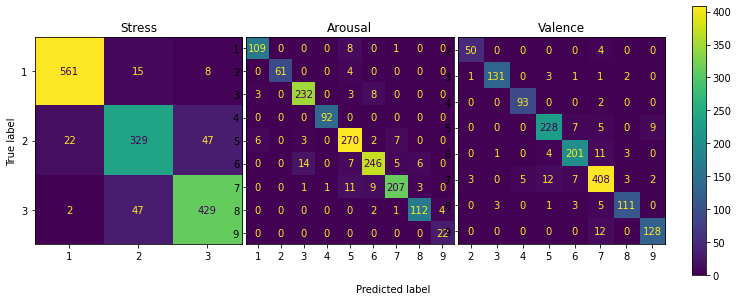

In [17]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(10,15))

confusion_matrix_stress = metrics.confusion_matrix(y_stress, y_hat_stress)
display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix_stress, display_labels = [1,2,3])
display.plot(ax=ax[0])
display.ax_.set_title("Stress")
display.im_.colorbar.remove()
display.ax_.set_xlabel('')

confusion_matrix_arousal = metrics.confusion_matrix(y_arousal, y_hat_arousal)
display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix_arousal, display_labels = [1,2,3,4,5,6,7,8,9])
display.plot(ax=ax[1])
display.ax_.set_title("Arousal")
display.im_.colorbar.remove()
display.ax_.set_xlabel('')
display.ax_.set_ylabel('')

confusion_matrix_valence = metrics.confusion_matrix(y_valence, y_hat_valence)
display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix_valence, display_labels = [2,3,4,5,6,7,8,9])
display.plot(ax=ax[2])
display.ax_.set_title("Valence")
display.im_.colorbar.remove()
display.ax_.set_xlabel('')
display.ax_.set_ylabel('')

fig.tight_layout()
fig.text(0.5, 0.36, 'Predicted label', ha='left')
fig.subplots_adjust(wspace=0.02, hspace=0.01)
fig.colorbar(display.im_, ax=ax,fraction=0.02, pad=0.04)
fig.show()

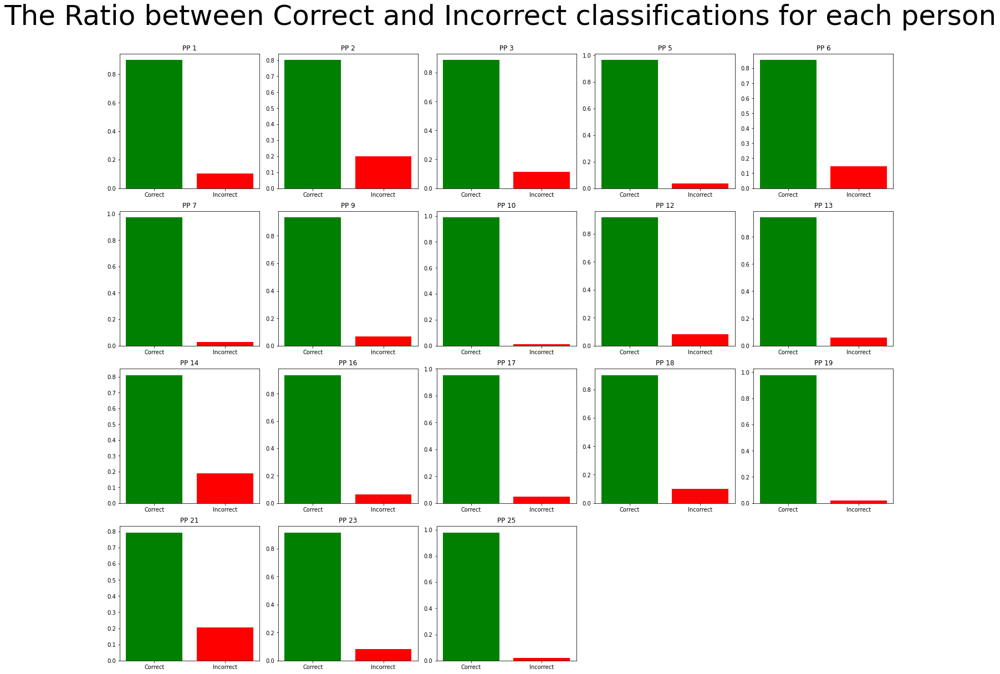

In [60]:
fig=plt.figure(figsize=(20,25))
fig.suptitle("The Ratio between Correct and Incorrect classifications for each person",fontsize=50)
index=1
for i in range(26):
    
    if((pp_true_false[i][0]!=0)and(pp_true_false[i][1]!=0)):
        plt.subplot(6,5,index)
        tmp=pp_true_false[i][0]+pp_true_false[i][1]
        pp_true_false[i][0]=(float(pp_true_false[i][0])/float(tmp))
        pp_true_false[i][1]=(float(pp_true_false[i][1])/float(tmp))
        plt.bar(["Correct","Incorrect"],pp_true_false[i], color = ['green','red'])
        plt.title("PP "+str(i))
        index+=1
fig.tight_layout()
fig.subplots_adjust(top=0.93)

    



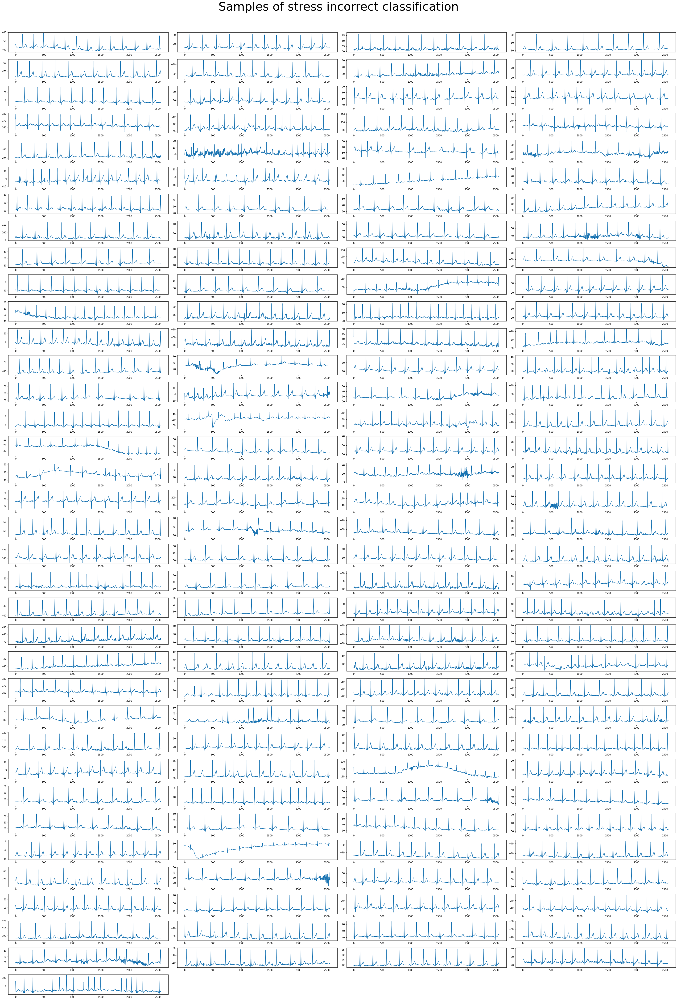

In [61]:
# plot the wrong samples of stress
samples_per_row=int(len(stress_wrong)/4+1)
fig=plt.figure(figsize=(40,60))
fig.suptitle("Samples of stress incorrect classification",fontsize=50)
for i in range(len(stress_wrong)):
    plt.subplot(samples_per_row,4,i+1)
    plt.plot(stress_wrong[i][0])
fig.tight_layout()
fig.subplots_adjust(top=0.95)

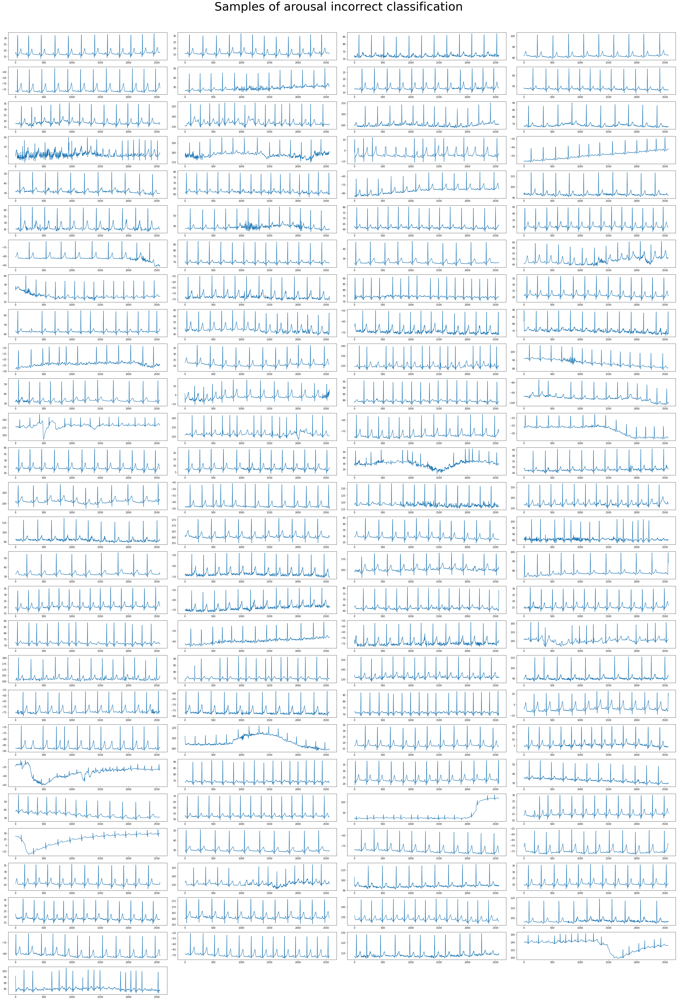

In [30]:
# plot the wrong samples of arousal
samples_per_row=int(len(arousal_wrong)/4+1)
fig=plt.figure(figsize=(40,60))
fig.suptitle("Samples of arousal incorrect classification",fontsize=50)
for i in range(len(arousal_wrong)):
    plt.subplot(samples_per_row,4,i+1)
    plt.plot(arousal_wrong[i][0])
fig.tight_layout()
fig.subplots_adjust(top=0.95)

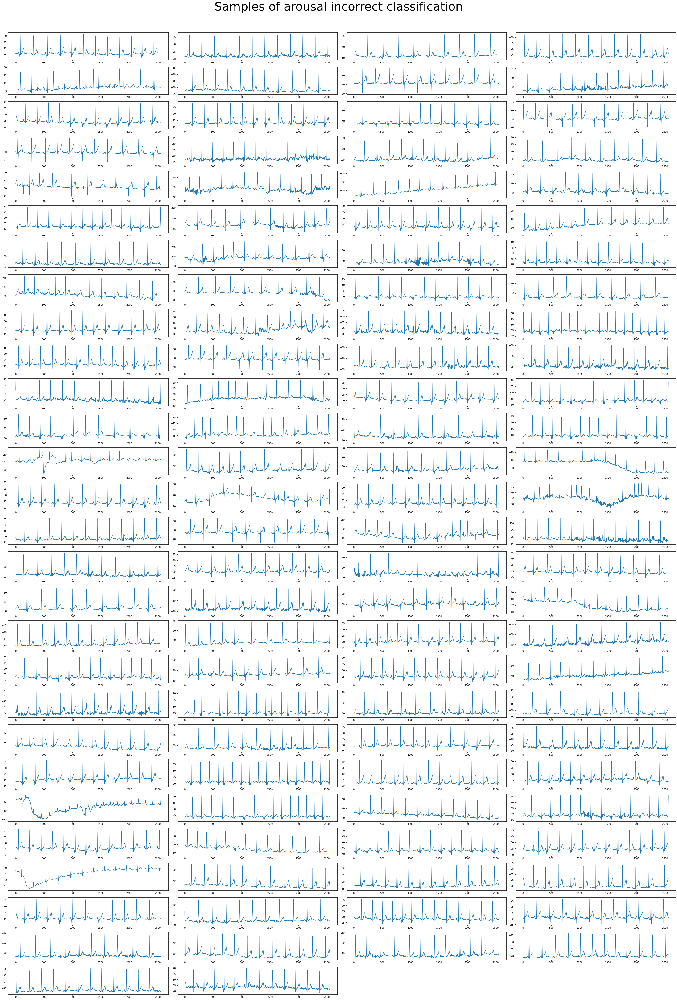

In [31]:
# plot the wrong samples of valence
samples_per_row=int(len(valence_wrong)/4+1)
fig=plt.figure(figsize=(40,60))
fig.suptitle("Samples of arousal incorrect classification",fontsize=50)
for i in range(len(valence_wrong)):
    plt.subplot(samples_per_row,4,i+1)
    plt.plot(valence_wrong[i][0])
fig.tight_layout()
fig.subplots_adjust(top=0.95)

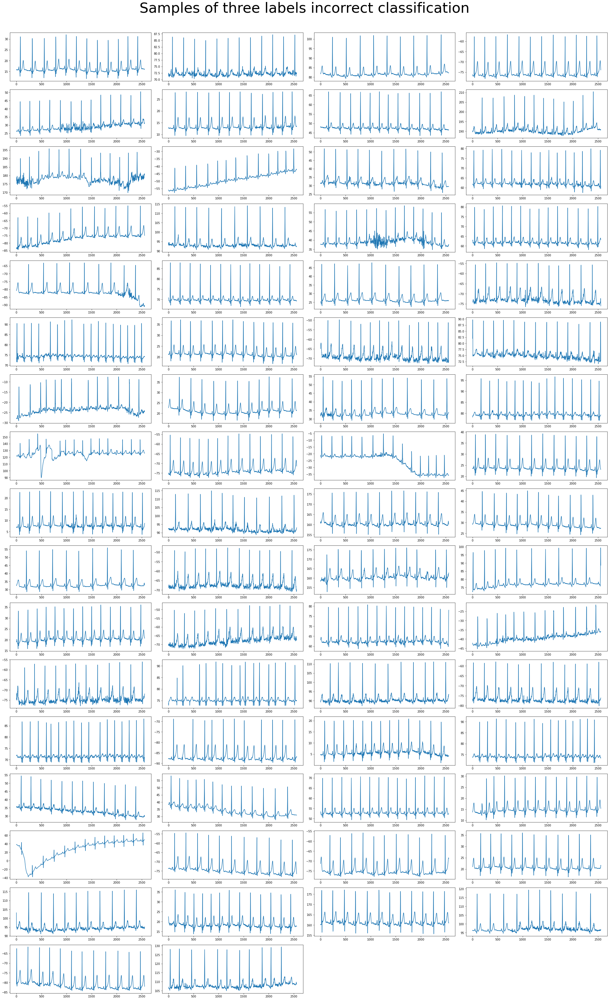

In [32]:
# plot the wrong samples for all labels
samples_per_row=int(len(wrong_samples)/4+1)
fig=plt.figure(figsize=(30,50))
fig.suptitle("Samples of three labels incorrect classification",fontsize=50)
for i in range(len(wrong_samples)):
    plt.subplot(samples_per_row,4,i+1)
    plt.plot(wrong_samples[i][0])
fig.tight_layout()
fig.subplots_adjust(top=0.95)



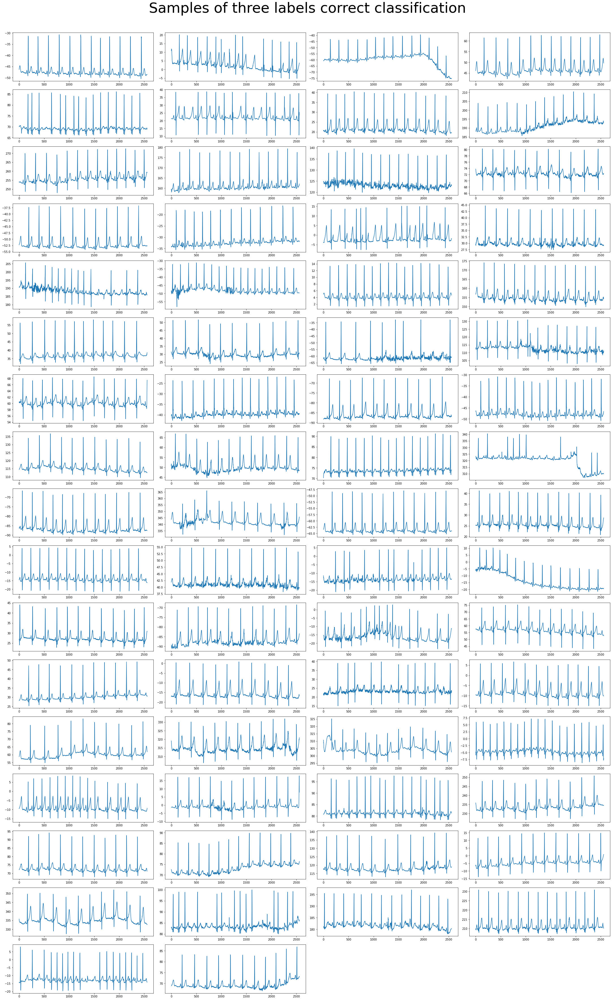

In [33]:
# plot the good samples for all labels
fig=plt.figure(figsize=(30,50))
fig.suptitle("Samples of three labels correct classification",fontsize=50)
for i in range(len(wrong_samples)):
    plt.subplot(17,4,i+1)
    plt.plot(good_samples[i][0])
fig.tight_layout()
fig.subplots_adjust(top=0.95)

**Labels Analysis - counting of the the samples of classes of each label**

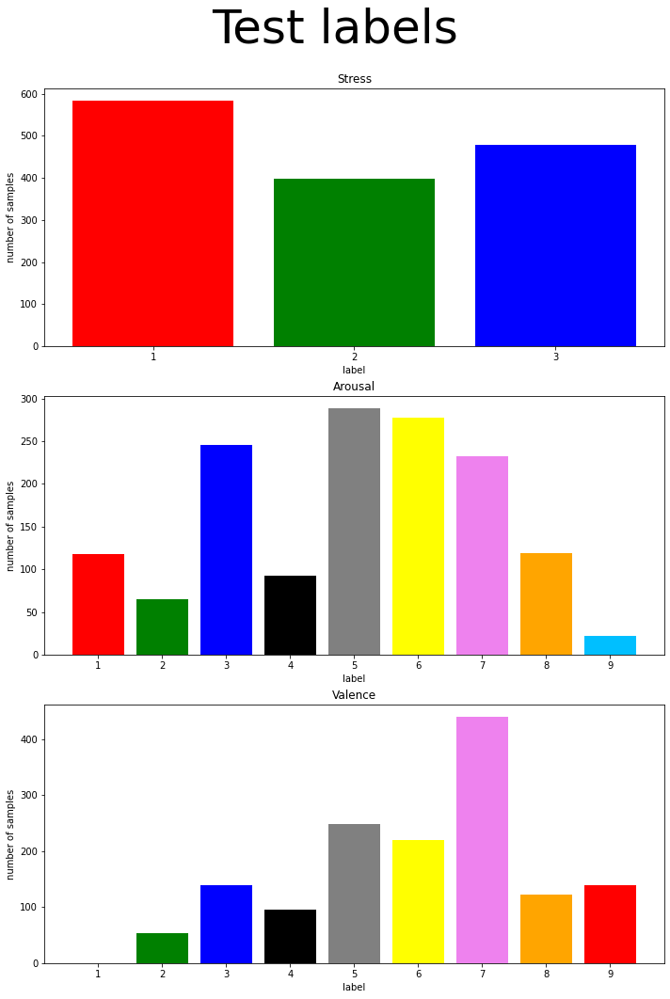

In [35]:
# test labels

#stress
labels_stress=test_loader_recovered.dataset.tensors[1][:,1]
labels_stress=labels_stress.numpy()
stress_cnt=[]
stress_x=[]
for i in range(1+np.max(labels_stress)):
    stress_cnt.append(np.count_nonzero(labels_stress==i))
    stress_x.append(i+1)

#arousal
labels_arousal=test_loader_recovered.dataset.tensors[1][:,2]
labels_arousal=labels_arousal.numpy()
arousal_cnt=[]
arousal_x=[]
for i in range(1+np.max(labels_arousal)):
    arousal_cnt.append(np.count_nonzero(labels_arousal==i))
    arousal_x.append(i+1)

#valence
labels_valence=test_loader_recovered.dataset.tensors[1][:,3]
labels_valence=labels_valence.numpy()
valence_cnt=[]
valence_x=[]
for i in range(1+np.max(labels_valence)):
    valence_cnt.append(np.count_nonzero(labels_valence==i))
    valence_x.append(i+1)


fig=plt.figure(figsize=(10,15))
fig.suptitle("Test labels",fontsize=50)

plt.subplot(3,1,1)
plt.bar(stress_x, stress_cnt, tick_label=stress_x, color = ['red', 'green','blue'])
plt.xlabel('label')
plt.ylabel('number of samples')
plt.title("Stress")

plt.subplot(3,1,2)
plt.bar(arousal_x, arousal_cnt, tick_label=arousal_x, color =['red','green','blue',
'black','gray','yellow','violet','orange','deepskyblue'])
plt.xlabel('label')
plt.ylabel('number of samples')
plt.title("Arousal")

plt.subplot(3,1,3)
plt.bar(valence_x,valence_cnt, tick_label=valence_x, color =['red','green','blue',
'black','gray','yellow','violet','orange'])
plt.xlabel('label')
plt.ylabel('number of samples')
plt.title("Valence")

fig.tight_layout()
fig.subplots_adjust(top=0.90)


In [ ]:
# train labels

#stress
labels_stress=train_loader_recovered.dataset.tensors[1][:,1]
labels_stress=labels_stress.numpy()
stress_cnt=[]
stress_x=[]
for i in range(1+np.max(labels_stress)):
    stress_cnt.append(np.count_nonzero(labels_stress==i))
    stress_x.append(i+1)

#arousal
labels_arousal=train_loader_recovered.dataset.tensors[1][:,2]
labels_arousal=labels_arousal.numpy()
arousal_cnt=[]
arousal_x=[]
for i in range(1+np.max(labels_arousal)):
    arousal_cnt.append(np.count_nonzero(labels_arousal==i))
    arousal_x.append(i+1)

#valence
labels_valence=train_loader_recovered.dataset.tensors[1][:,3]
labels_valence=labels_valence.numpy()
valence_cnt=[]
valence_x=[]
for i in range(1+np.max(labels_valence)):
    valence_cnt.append(np.count_nonzero(labels_valence==i))
    valence_x.append(i+1)


fig=plt.figure(figsize=(10,15))
fig.suptitle("Train labels",fontsize=50)

plt.subplot(3,1,1)
plt.bar(stress_x, stress_cnt, tick_label=stress_x, color = ['red', 'green','blue'])
plt.xlabel('label')
plt.ylabel('number of samples')
plt.title("Stress")

plt.subplot(3,1,2)
plt.bar(arousal_x, arousal_cnt, tick_label=arousal_x, color =['red','green','blue',
'black','gray','yellow','violet','orange','deepskyblue'])
plt.xlabel('label')
plt.ylabel('number of samples')
plt.title("Arousal")

plt.subplot(3,1,3)
plt.bar(valence_x,valence_cnt, tick_label=valence_x, color =['red','green','blue',
'black','gray','yellow','violet','orange'])
plt.xlabel('label')
plt.ylabel('number of samples')
plt.title("Valence")

fig.tight_layout()
fig.subplots_adjust(top=0.90)

**plot results**

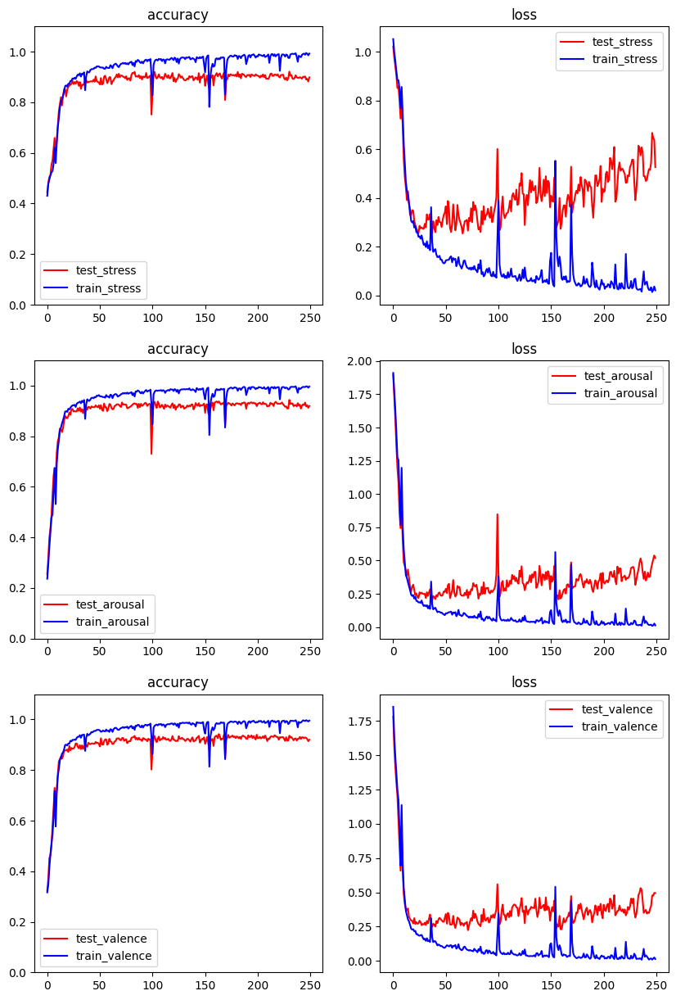

In [ ]:
#index 6
model.plot_acc_and_loss(False,0)

In [ ]:
model.predict_step()

Text(0.5, 1.0, 'inex 8')

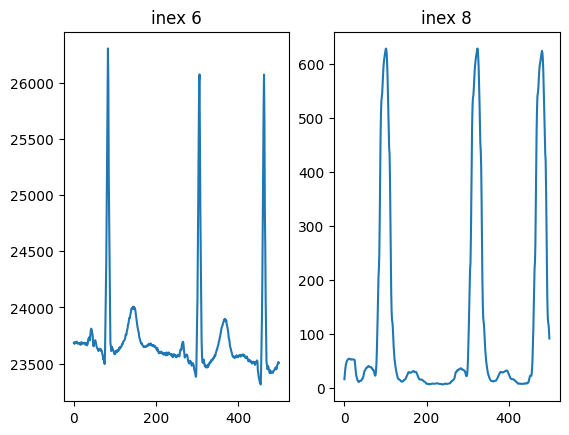

In [ ]:
index8 = data_preprocessing.csv_to_list('./swell/PP9/sample/index_8/pp1_18-9-2012_c1.csv')
index6 = data_preprocessing.csv_to_list('./swell/PP9/sample/pp1_18-9-2012_c1.csv')
#plt.figure(figsize = (9,15))

plt.subplot(1,2,1)
plt.plot(index6[:500])
plt.title("inex 6")

plt.subplot(1,2,2)
plt.plot(index8[:500])
plt.title("inex 8")


**wrong stress**

In [ ]:
#tot wrong for each pp
cnt_s = [0] * 26
with open("./light_output/wrong_pp_stress.csv", 'r') as file:
  csvreader = csv.reader(file)
  for row in csvreader:
    r=np.array((row[0][1:len(row[0])-1]).split(','))
    #for skipping over empty rows
    if(r[0]!=''):
      for i in range(len(r)):
        cnt_s[int(r[i])]+=1
    
print(cnt_s)



[0, 2472, 5551, 2431, 42, 1320, 5856, 584, 0, 1148, 92, 0, 2648, 2036, 2788, 11, 1155, 308, 3189, 1367, 93, 3721, 78, 800, 181, 25]


In [ ]:
# all wrong per epoch
counter_s = np.zeros((250,26))
epoch=0
row_num=0
with open("./light_output/wrong_pp_stress.csv", 'r') as file:
  csvreader = csv.reader(file)
  for row in csvreader:
    r=np.array((row[0][1:len(row[0])-1]).split(','))
    if(r[0]!=''):
      for i in range(len(r)):
        counter_s[epoch, int(r[i])]+=1
    row_num+=1
    if(row_num>=12):
        row_num=0
        if(epoch<249):
            epoch+=1
print(counter_s.argmax(axis=1))


      



[ 6 19 21 21 18 18  6  2 18  2  2  2  2  2  6  2  3  2  2  6  2  2  2  2
  6  6  6  2  6  6  2  2  6  2  6  6  6  2  6  2  6  6  6  6  6  6  6  6
  6  6  6  6  6  6  6  6  6  2  6  2  6  6  6  6  6  6  6  6  6  6  6  6
  6  6  6  6  6  2  6  6  6  6  2  2  2  6  6  6  6  2  6  6  6  6  6  6
  6  6  2  2  6  2  6  6  6  2  6  2  6  2  2  2  2  6  2  6  6  2  2  2
  6  6  2  2  2  2  2  6  6  2  6  2  2  2  2  6  2  2  6  6  2  6  6  2
  6  2  2  2  6  2  6  2  6  6  2  6  2  2  2  2  2  2  2  2  6  6  6  6
  2  2  6  6  6  6  6  2  6  6  2  6  6  2  6  6  2  6  6  2  6  6  6  6
  6  2  6  2  6  6  2  6  6  6  6  6  6  6  2  6  6  2  2  6  2  2  2  2
  6  6  2  6  2  2  2  2  2  2  2  2 12  2  6  6  2  2  6  6  2  6  6  2
  6  6  6  6  6  6  6  6  2  2]


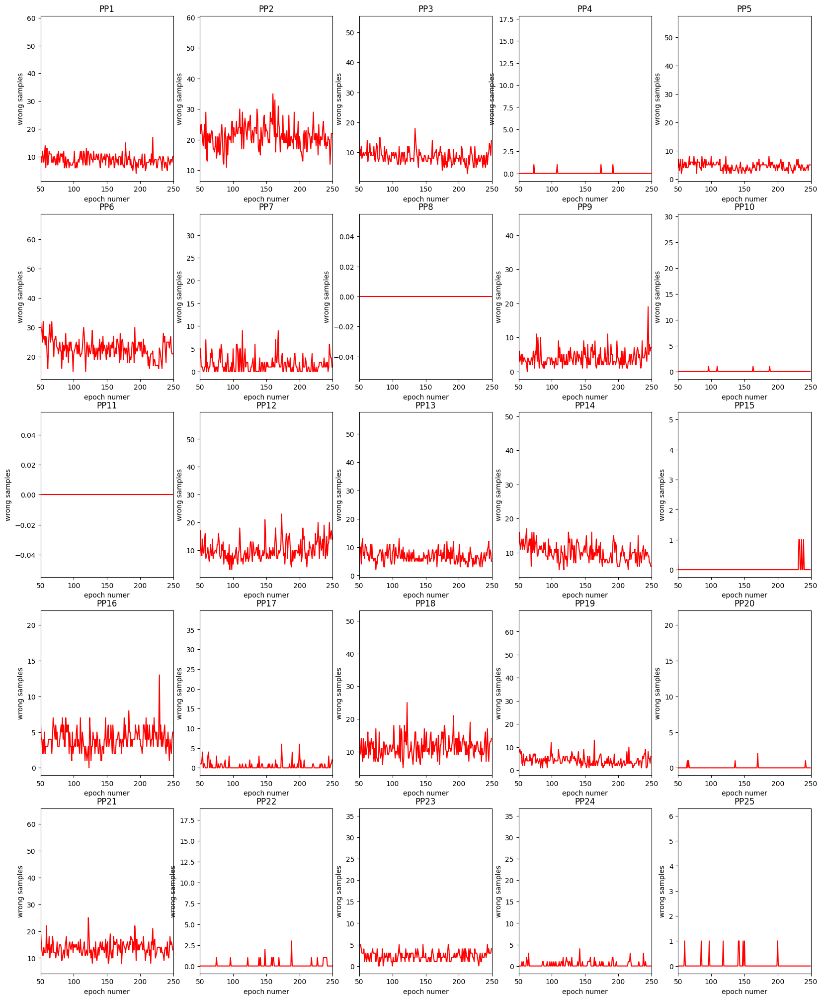

In [ ]:
plt.figure(figsize = (20,25))
for i in range(counter_s.shape[1]-1):
        index=i+1
        plt.subplot(5,5,index)
        plt.plot(counter_s[:,index],color='r')
        plt.ylabel("wrong samples")
        plt.xlabel("epoch numer")
        plt.xlim((50,len(counter_s[:,index])))
        plt.title("PP"+str(index))


**Wrong arousal**

In [ ]:
#tot wrong for each pp
cnt_a = [0] * 26
with open("./light_output/wrong_pp_arousal.csv", 'r') as file:
  csvreader = csv.reader(file)
  num = 0
  for row in csvreader:
    #print("row num is ",num)
    num+=1
    r=np.array((row[0][1:len(row[0])-1]).split(','))
    #for skipping over empty rows
    if(r[0]!=''):
      for i in range(len(r)):
        cnt_a[int(r[i])]+=1
    
print(cnt_a)



[0, 2519, 5887, 2410, 80, 1425, 2437, 648, 0, 1219, 205, 0, 2759, 527, 2826, 138, 1263, 564, 857, 198, 43, 3793, 173, 793, 389, 265]


In [ ]:
# all wrong per epoch
counter_a = np.zeros((250,26))
epoch=0
row_num=0
with open("./light_output/wrong_pp_arousal.csv", 'r') as file:
  csvreader = csv.reader(file)
  for row in csvreader:
    r=np.array((row[0][1:len(row[0])-1]).split(','))
    if(r[0]!=''):
      for i in range(len(r)):
        counter_a[epoch, int(r[i])]+=1
    row_num+=1
    if(row_num>=12):
        row_num=0
        if(epoch<249):
            epoch+=1
print(counter_a.argmax(axis=1))

[ 2 21 21  7 16  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  2  2 12  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2 21  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  1  2  2  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2 12  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2 12  2  2  2  2  2  2 12  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2 12  2  2
  2  2  2  2  2  2 12  2  2  2]


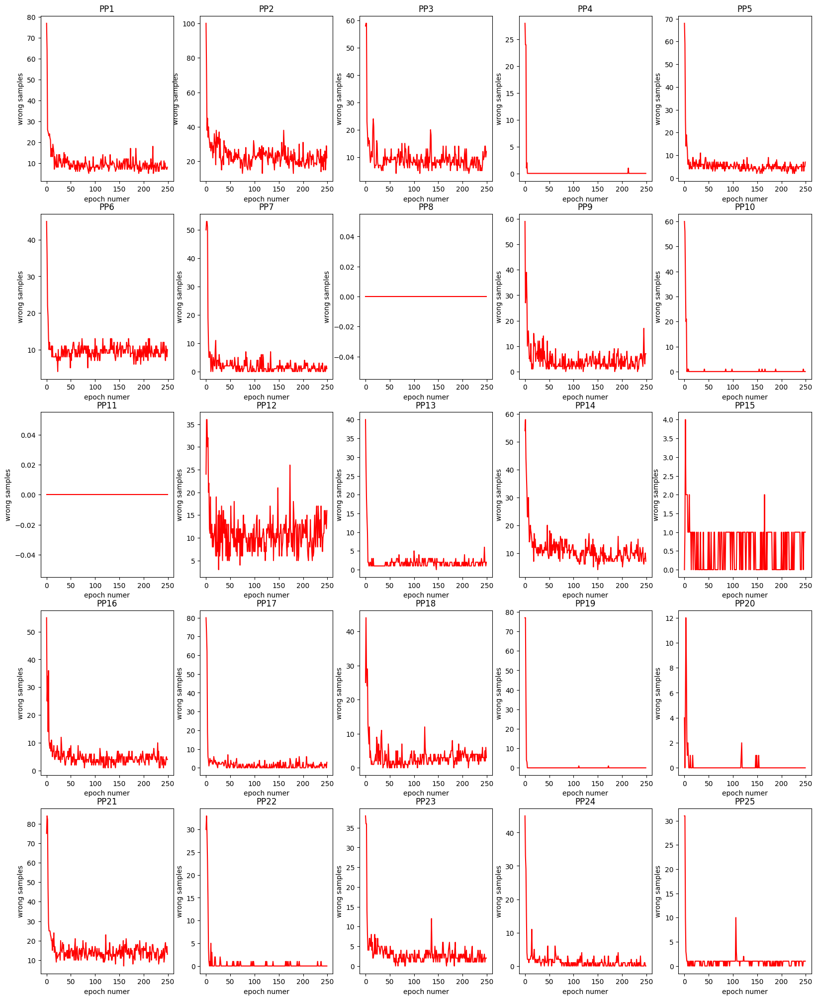

In [ ]:
plt.figure(figsize = (20,25))
for i in range(counter_a.shape[1]-1):
        index=i+1
        plt.subplot(5,5,index)
        plt.plot(counter_a[:,index],color='r')
        plt.ylabel("wrong samples")
        plt.xlabel("epoch numer")
        plt.title("PP"+str(index))

**Wrong valence**

In [ ]:
#tot wrong for each pp
cnt_v = [0] * 26
with open("./light_output/wrong_pp_valence.csv", 'r') as file:
  csvreader = csv.reader(file)
  num = 0
  for row in csvreader:
    #print("row num is ",num)
    num+=1
    r=np.array((row[0][1:len(row[0])-1]).split(','))
    #for skipping over empty rows
    if(r[0]!=''):
      for i in range(len(r)):
        cnt_v[int(r[i])]+=1
    
print(cnt_v)

[0, 2550, 5959, 2273, 56, 367, 2615, 136, 0, 1285, 158, 0, 527, 2075, 2609, 53, 1197, 559, 2726, 186, 22, 3753, 79, 812, 155, 233]


In [ ]:
# all wrong per epoch
counter_v = np.zeros((250,26))
epoch=0
row_num=0
with open("./light_output/wrong_pp_valence.csv", 'r') as file:
  csvreader = csv.reader(file)
  for row in csvreader:
    r=np.array((row[0][1:len(row[0])-1]).split(','))
    if(r[0]!=''):
      for i in range(len(r)):
        counter_v[epoch, int(r[i])]+=1
    row_num+=1
    if(row_num>=12):
        row_num=0
        if(epoch<249):
            epoch+=1
print(counter_v.argmax(axis=1))

[ 6  5 12 12  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  2  2 13  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2 21  2  2  2  2  2  2  2  2  2  2  2  2  2 21  2  2  2  2 21  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2 21  2  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2 21  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2 18  2  2  2  2
  2  2  2  1  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2 21  2  2  2]


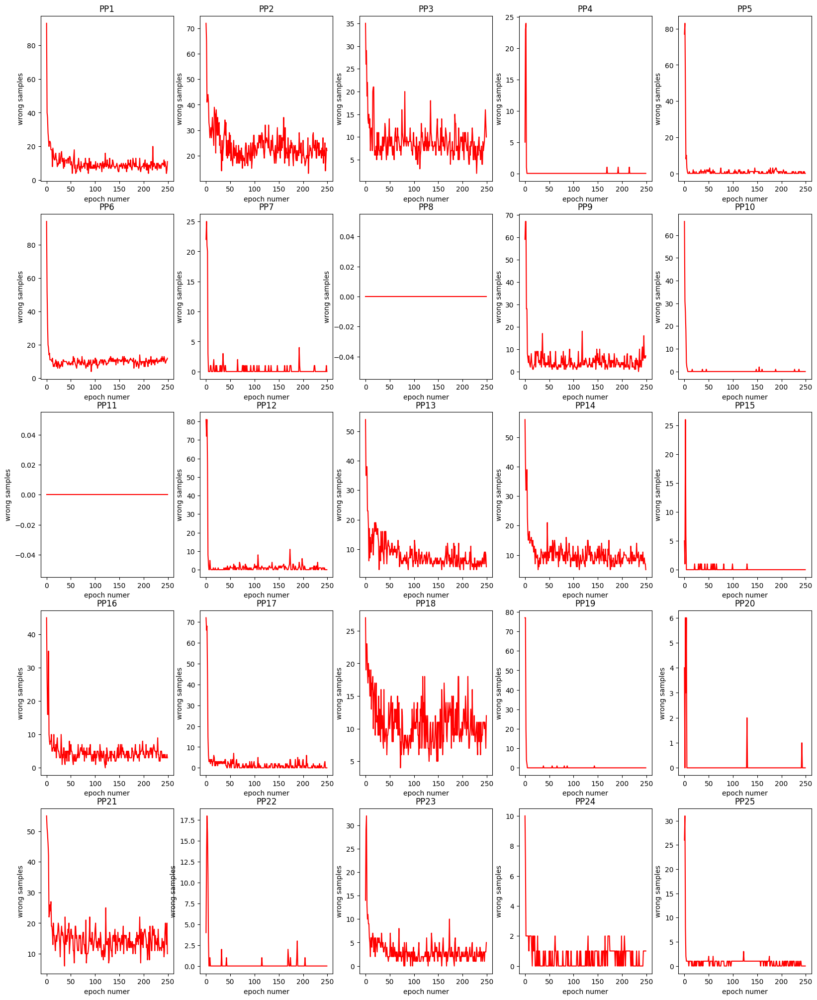

In [ ]:
plt.figure(figsize = (20,25))
for i in range(counter_v.shape[1]-1):
        index=i+1
        plt.subplot(5,5,index)
        plt.plot(counter_v[:,index],color='r')
        plt.ylabel("wrong samples")
        plt.xlabel("epoch numer")
        plt.title("PP"+str(index))

**Wrong total**

In [ ]:
#wrong per PP
tot_cnt=cnt_s+cnt_a+cnt_v
print(tot_cnt)

[0, 2472, 5551, 2431, 42, 1320, 5856, 584, 0, 1148, 92, 0, 2648, 2036, 2788, 11, 1155, 308, 3189, 1367, 93, 3721, 78, 800, 181, 25, 0, 2519, 5887, 2410, 80, 1425, 2437, 648, 0, 1219, 205, 0, 2759, 527, 2826, 138, 1263, 564, 857, 198, 43, 3793, 173, 793, 389, 265, 0, 2550, 5959, 2273, 56, 367, 2615, 136, 0, 1285, 158, 0, 527, 2075, 2609, 53, 1197, 559, 2726, 186, 22, 3753, 79, 812, 155, 233]


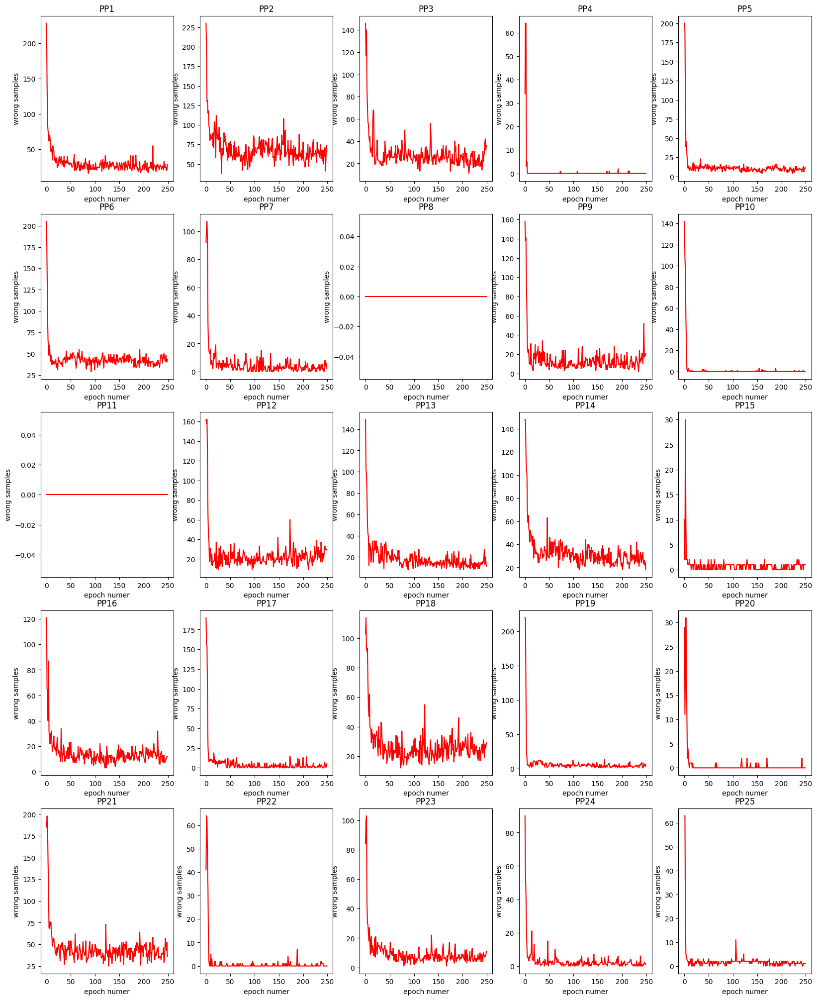

In [ ]:
plt.figure(figsize = (20,25))
for i in range(tot_counter.shape[1]-1):
        index=i+1
        plt.subplot(5,5,index)
        plt.plot(tot_counter[:,index],color='r')
        plt.ylabel("wrong samples")
        plt.xlabel("epoch numer")
        plt.title("PP"+str(index))

**Simple vs Hard**

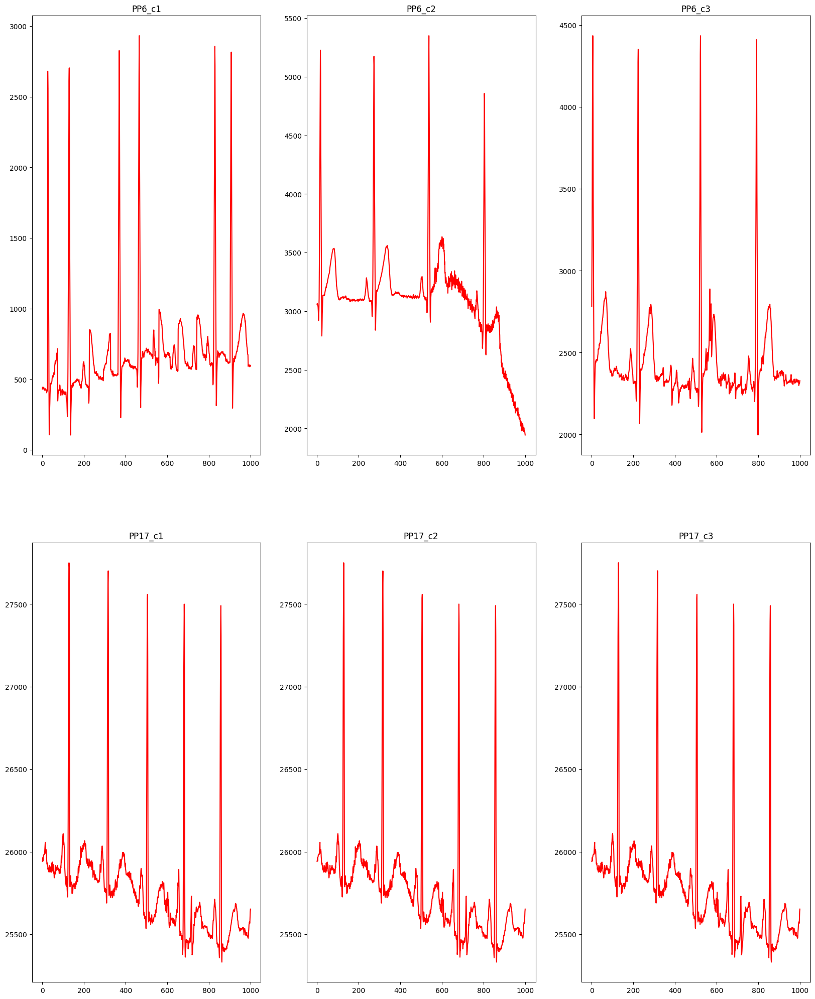

In [ ]:
PP6 =[]
PP6.append(data_preprocessing.csv_to_list('../pre_processing_and_recover_network/csv_files/pp6_1-10-2012_c1.csv'))
PP6.append(data_preprocessing.csv_to_list('../pre_processing_and_recover_network/csv_files/pp6_1-10-2012_c2.csv'))
PP6.append(data_preprocessing.csv_to_list('../pre_processing_and_recover_network/csv_files/pp6_1-10-2012_c3.csv'))

PP17 =[]
PP17.append(data_preprocessing.csv_to_list('../pre_processing_and_recover_network/csv_files/pp17_17-10-2012_c1.csv'))
PP17.append(data_preprocessing.csv_to_list('../pre_processing_and_recover_network/csv_files/pp17_17-10-2012_c1.csv'))
PP17.append(data_preprocessing.csv_to_list('../pre_processing_and_recover_network/csv_files/pp17_17-10-2012_c1.csv'))

plt.figure(figsize = (20,25))
for i in range(3):
        index=i+1
        plt.subplot(2,3,index)
        plt.plot(PP6[i][1000:2000],color='r')
        plt.title("PP6_c"+str(index))

        plt.subplot(2,3,index+3)
        plt.plot(PP17[i][1000:2000],color='r')
        plt.title("PP17_c"+str(index))





**10-Fold**

In [ ]:
swell_data = data_preprocessing.load_data(os.path.join("../pre_processing_and_recover_network/swell_dataset","swell_dict.npy"))
swell_data = data_preprocessing.swell_prepare_for_10fold(swell_data)

#split the index
total_fold = 10
kf = KFold(n_splits = total_fold, shuffle = True, random_state = True)
train_index = []
test_index = []
for train_i, test_i in kf.split(swell_data):
    train_index.append(train_i)
    test_index.append(test_i)


In [ ]:
# training
for k in range(total_fold):
    x_train = torch.from_numpy(swell_data[train_index[k],4:]).float().unsqueeze(1)
    y_train = torch.from_numpy(swell_data[train_index[k],1:4]).long()
    x_test = torch.from_numpy(swell_data[test_index[k],4:]).float().unsqueeze(1)
    y_test = torch.from_numpy(swell_data[test_index[k],1:4]).long()

    tensor_dataset = torch.utils.data.TensorDataset(x_train, y_train)
    tensor_dataset_test = torch.utils.data.TensorDataset(x_test, y_test)

    train_loader = DataLoader(tensor_dataset, batch_size=128)
    test_loader = DataLoader(tensor_dataset_test,batch_size=128)
    
    # training
    model = EmotionRec()
    model.declare_new_fold_csv(k)
    trainer = pl.Trainer(gpus=1 , max_epochs = 250)
    trainer.fit(model, train_loader,test_loader)

